# Introduction

Le but de ce projet est de développer un modèle de classification multiple, à partir d'images de radiographies pulmonaires.  

Cette partie est consacrée à la visualisation des données, sous forme de graphiques et d'images.  
Les interprétations qui en seront faites, seront d'une grande utilité dans le cadre de la mise en oeuvre d'un modéle prédictif.    

Il est important de souligner que les poumons constituent la partie utile de l'image, c'est-à-dire la partie qui permet de distinguer entre les classes.

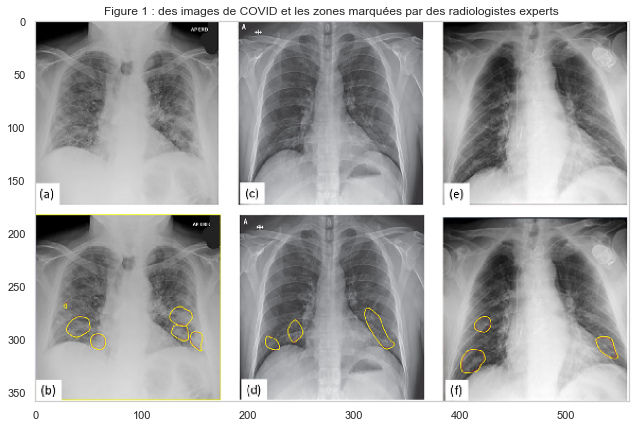

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

path_im = r"C:\Users\Akram EL ABDI\Desktop\Formation_Datascientist\Projet\Code\image_ref.png"
im_exemple = plt.imread(path_im)
plt.figure(figsize = (14,7))
plt.title('Figure 1 : des images de COVID et les zones marquées par des radiologistes experts')
plt.grid(False)
plt.imshow(im_exemple)


### Source de la figure 1 :

Shervin Minaee, Rahele Kafieh, Milan Sonka, Shakib Yazdani, Ghazaleh Jamalipour Soufi 

Deep-COVID: Predicting COVID-19 from chest X-ray images using deep transfer learning,
Medical Image Analysis,
Volume 65,
2020.

## Interprétation de la figure 1
La figure 1 montre des radiographies de patients atteint de COVID-19.

Sur la première ligne, les radiographies brutes sont présentées. (image(a) ,image(c) et image(e))  
Sur la deuxième ligne, les mêmes radiographies, interprétées par des experts en radiologie. (image(b) ,image(d) et image(f))  
Les lésions caractéristiques de la présence de la maladie sont cerclées de jaunes.

# 1) Détermination du nombre d'images par classe

L'objectif est de savoir si nous sommes en présence d'un jeu de données équilibré.

* Importation des packages 

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import cv2 #import OpenCV

import os
import sys


* Affichage du nombre d'images par dossier

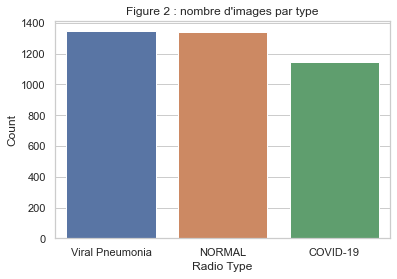

In [3]:
FOLDERS = ['Viral Pneumonia', 'NORMAL', 'COVID-19']

# Nombre d'images par dossier
NB_im = []
for folder in FOLDERS:
    path_to_folder = r"C:\Users\Akram EL ABDI\Desktop\Formation_Datascientist\Projet\COVID-19 Radiography Database\%s" %(folder)

    NB_im.append(len(os.listdir(path_to_folder)))

NB_im

dictionnary = {'Radio Type': FOLDERS , 'Count': NB_im}
df = pd.DataFrame(dictionnary)

sns.set_theme(style="whitegrid")
ax = sns.barplot(x="Radio Type", y="Count", data=df).set_title("Figure 2 : nombre d'images par type")


## Interprétation de la figure 2

La figure ci-dessus montre que le jeu de données, dont nous disposons, est bien équilibré.

# 2) Regroupement des images dans un dataframe 

Dans notre jeu de données, les radiographies présentent les résolutions suivantes:
* 256x256
* 331x331
* 160x187x3
* 197x253x3
* 1024x1024
* 1024x1024x3

L'objectif de cette partie est de grouper toutes les images dans un dataframe afin de faciliter leur traitement.  
Cette opération nécéssite d'avoir des images de même résolution, celle choisie pour l'ensemble des images est 256x256 pixels. 

Première étape : vérifier visuellement que les images transformées en 256X256 pixels, ressemblent aux images au format de base.

In [4]:
def im_resize_256(img):
    """
    Cette fonction lit une image et retourne la même image avec une résolution de 256 X 256
    """
    if img.shape == (256,256):
        img_ret = img
    else :
        img_ret = cv2.resize(img, dsize = (256,256))
    return img_ret



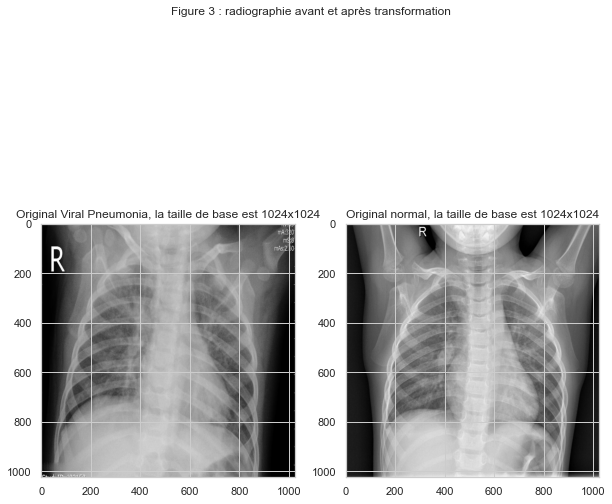

Text(0.5, 1.0, 'Resized NORMAL')

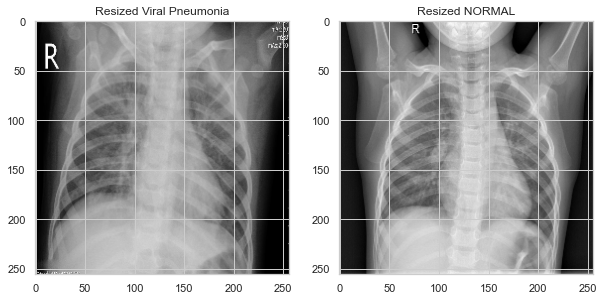

In [8]:
path_im_viral = r"C:\Users\Akram EL ABDI\Desktop\Formation_Datascientist\Projet\COVID-19 Radiography Database\Viral Pneumonia\Viral Pneumonia (1).png"
path_im_normal = r"C:\Users\Akram EL ABDI\Desktop\Formation_Datascientist\Projet\COVID-19 Radiography Database\Normal\Normal (1).png"


# Original
fig = plt.figure(figsize = (10, 10))
fig.suptitle("Figure 3 : radiographie avant et après transformation")
(ax1, ax2) = fig.subplots(1, 2)

im_viral = plt.imread(path_im_viral)
ax1.imshow(im_viral, cmap = 'gray')
Title_viral = 'Original Viral Pneumonia, la taille de base est %sx%s' %(im_viral.shape[0],im_viral.shape[1])
ax1.set_title(Title_viral)

im_normal = plt.imread(path_im_normal)
ax2.imshow(im_normal, cmap = 'gray')
Title_normal = 'Original normal, la taille de base est %sx%s' %(im_normal.shape[0],im_normal.shape[1])
ax2.set_title(Title_normal)
plt.show()

# Resized
fig = plt.figure(figsize = (10, 10))
(ax1, ax2) = fig.subplots(1, 2)
im_viral_resized = im_resize_256(im_viral)
ax1.set_title('Resized Viral Pneumonia')
ax1.imshow(im_viral_resized, cmap = 'gray')
im_normal_resized = im_resize_256(im_normal)
ax2.imshow(im_normal_resized, cmap = 'gray')
ax2.set_title('Resized NORMAL')


## Interprétation de la figure 3

La comparaison visuelle sur les exemples ci-dessus montrent que les images ne sont pas impactées par le changement de format.

Deuxième étape :
* Lire l'ensemble des images et les transformer en des images de taille 256 X 256 
* Stocker les images dans un DataFrame

In [9]:
# Vecteur des noms d'images
Vnoms = []
# Vecteur des types
Vtypes = []
# Vecteur des images
Vim = np.empty((np.array(NB_im).sum(), 256*256))

### Remplissage des vecteurs

j = 0
# Parcourir les types
for type_im, nb in zip(FOLDERS,NB_im):
    # Parcourir les images de chaque type
    for i in range(1,nb+1):
        # Type de l'image
        Vtypes.append(type_im)
        # Construire le nom de l'image
        nom = "%s (%s).png" %(type_im,i)
        Vnoms.append(nom)
        # Chemin de l'image
        path_im = r"C:\Users\Akram EL ABDI\Desktop\Formation_Datascientist\Projet\COVID-19 Radiography Database\%s\%s" %(type_im,nom)
        # Lecture de l'image
        img_gray = cv2.imread(path_im, cv2.IMREAD_GRAYSCALE) 
        # Transformer l'image en une image de taille 256 X 256
        img_gray = im_resize_256(img_gray).reshape(256*256)
        # Inserer l'image dans le vecteur des images (Vim)
        Vim[j] = img_gray
        j = j+1

In [10]:
# Un DataFrame avec les images
df = pd.DataFrame(data = Vim, index = Vnoms)
# Spécifier que les éléments du dataframe sont des int
df = df.astype('int')
df

,0,1,2,3,4,5,6,7,8,9,...,65526,65527,65528,65529,65530,65531,65532,65533,65534,65535
Viral Pneumonia (1).png,1,1,2,3,3,3,3,14,19,21,...,0,0,0,0,0,0,0,0,0,0
Viral Pneumonia (2).png,72,76,78,75,105,143,152,145,138,139,...,0,0,0,0,0,0,0,0,0,0
Viral Pneumonia (3).png,26,31,32,34,36,42,47,49,49,55,...,0,0,0,0,0,0,0,0,0,0
Viral Pneumonia (4).png,0,0,0,1,2,4,4,6,6,9,...,0,0,0,0,0,0,0,0,0,0
Viral Pneumonia (5).png,0,0,0,0,0,0,1,22,24,32,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COVID-19 (1139).png,78,80,83,84,89,91,90,90,95,97,...,105,99,84,68,57,48,40,33,26,22
COVID-19 (1140).png,34,5,1,1,1,1,1,2,1,1,...,38,36,34,34,30,27,28,22,21,11
COVID-19 (1141).png,61,65,68,69,69,70,70,70,70,70,...,70,66,61,56,50,37,23,19,21,23
COVID-19 (1142).png,105,125,126,127,126,125,125,123,123,125,...,132,128,127,130,130,130,128,127,126,126


# 3) Etude de la distribution des moyennes et des écart-types des niveaux de gris 

Calcul de la moyenne et de l'écart-type des niveaux de gris pour chaque image

In [11]:
Vmeans = df.mean(axis = 1)
Vstd = df.std(axis = 1)

In [12]:
df_stat = pd.concat([Vmeans,Vstd, pd.DataFrame(data = Vtypes, index = Vnoms, columns = ['Type'])], axis = 1)
df_stat = df_stat.rename({0 : 'Mean', 1 : 'Std'}, axis = 1)
df_stat

,Mean,Std,Type
Viral Pneumonia (1).png,121.675507,60.063675,Viral Pneumonia
Viral Pneumonia (2).png,129.031067,72.269343,Viral Pneumonia
Viral Pneumonia (3).png,125.299194,68.161215,Viral Pneumonia
Viral Pneumonia (4).png,135.755280,74.600400,Viral Pneumonia
Viral Pneumonia (5).png,124.295456,66.245354,Viral Pneumonia
...,...,...,...
COVID-19 (1139).png,153.194916,48.371918,COVID-19
COVID-19 (1140).png,107.038849,37.058771,COVID-19
COVID-19 (1141).png,142.791580,36.277651,COVID-19
COVID-19 (1142).png,149.410843,30.379917,COVID-19


In [183]:
# h = sns.relplot(x = Vmeans, y = Vstd, hue = Vtypes, style = Vtypes, alpha = 0.5)
# h.fig.set_size_inches(15,8)


''

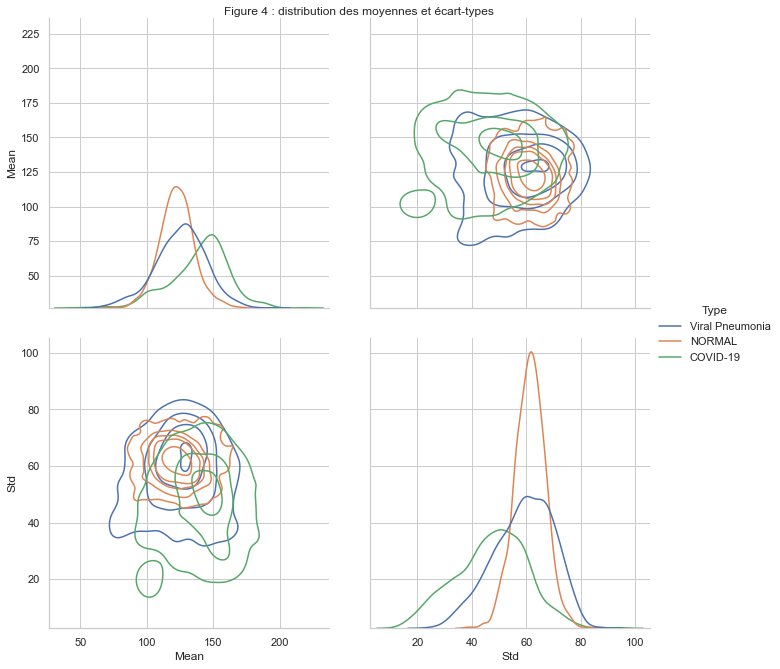

In [13]:
#g = sns.FacetGrid(df_stat, col = 'Type')
# g.map(plt.scatter, 'Mean', 'Std', alpha = 0.5)

g = sns.PairGrid(data = df_stat, hue = 'Type')
g.fig.set_size_inches(10,10)
g.fig.suptitle("Figure 4 : distribution des moyennes et écart-types")
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.kdeplot, n_levels=6)
g.add_legend()
;

## Interpétation de la figure 4

Nous constatons que :
* La dispersion des  moyennes et des écart-types des niveaux de gris, est importante.  Cette dispersion est plus accentuée pour les images de types COVID-19 et Viral Pneumonia.
* Contrairement aux autres images, les images de type COVID-19 ont tendance à avoir une moyenne plus élevée et un écart-type plus faible. Dans la suite du document, nous tenterons d'expliquer cette singularité.

# 4) Filtrage des pixels les moins pertinents

In [14]:
from sklearn.feature_selection import SelectPercentile
# Vecteur de modèles de SelectPercentile
Vpercen = [95,90,85,80,75,70]
Vmasks = []
for i, per in enumerate(Vpercen):
    Sel = SelectPercentile(percentile=per)
    Sel.fit_transform(Vim, Vtypes)
    mask = Sel.get_support()
    Vmasks.append(mask)

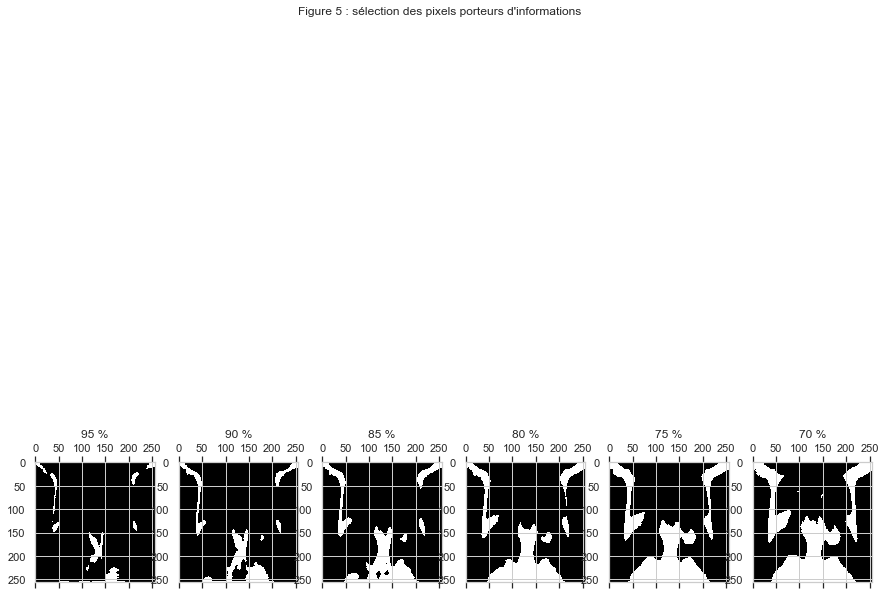

In [15]:
fig, axes = plt.subplots(nrows=1, ncols=6,figsize=(15,15))
fig.suptitle("Figure 5 : sélection des pixels porteurs d'informations")
for i, per in enumerate(Vpercen):
    axes[i].matshow(Vmasks[i].reshape(256,256), cmap = 'gray_r')
    title = "%s %%" %(per)
    axes[i].set_title(title)

# axes.title.set_text('My Plot Title')
#fig.canvas.set_window_title('Window Title')    


## Interprétation de la figure 5
Légitimement, nous pensions que les bords des radiographies étaient peu porteurs d'informations.  
Cependant, les bords verticaux de l'image ne sont toujous pas éliminés, même avec un paramètrage fixé à 70 %.  
Nous tenterons d'y apporter une explication dans la suite du document.

# 5) Application d'un modèle Isomap pour la visualisation des classes
Compte tenu du nombre important de features, nous utilisons une réduction de dimension afin d'obtenir une meilleure dinstinction visuelle des différentes classes.

In [11]:
from sklearn.manifold import LocallyLinearEmbedding, MDS, Isomap, TSNE

# un modèle isomap à 2 composantes
model_iso=Isomap(n_components=2)
proj_iso = model.fit_transform(Vim)

<AxesSubplot:>

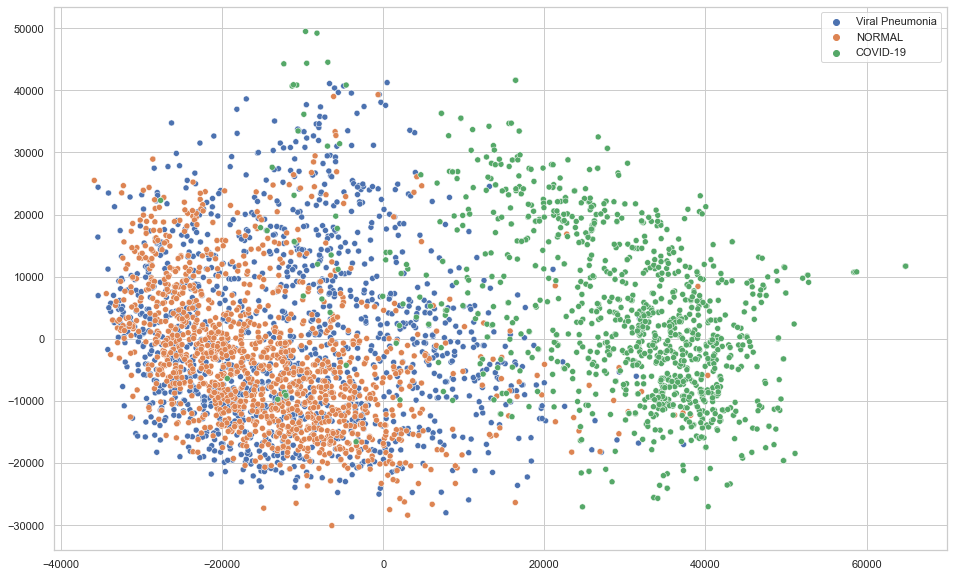

In [212]:
plt.figure(figsize=(16,10))
plt.title("Figure 6 : réduction de dimension avec Isomap ")
sns.scatterplot(
    x=proj_iso[:, 0],  y=proj_iso[:, 1] ,
    hue=Vtypes,
    legend="full",
    cmap='viridis_r'
)

## Interprétation de la figure 6

Cette réduction de dimension permet de discriminier la classe COVID-19 des autres classes.

A présent, nous allons afficher quelques images des différentes classes sur le graphe 2D.

In [7]:
def plot_components(data, model, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray_r', prefit = False):
    ax = ax or plt.gca()
    
    if not prefit :
        proj = model.fit_transform(data)
    else:
        proj = data
    ax.plot(proj[:, 0], proj[:, 1], '.b')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(data.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # On ne montre pas le points trop proches
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(images[i], cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)
            

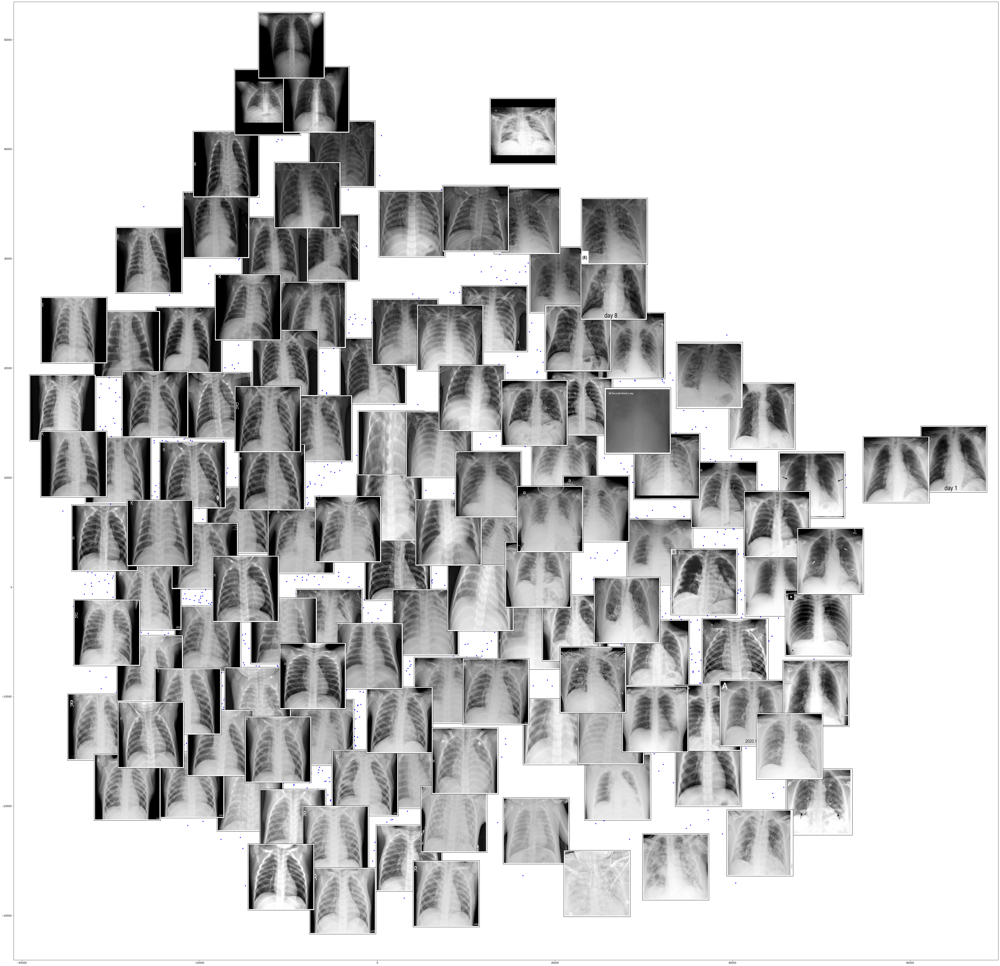

In [24]:
from matplotlib import offsetbox

fig, ax = plt.subplots(figsize=(70, 70))
fig.suptitle("Figure 7 : identification des facteurs de variance dans les radiographies")
plot_components(proj_iso,
                model=model_iso,
               images=Vim.reshape((-1, 256, 256)),
               cmap = 'gray',
               thumb_frac = .05, prefit = True)

## Interprétation de la figure 7

Nous constatons sur ce graphique que :
* Plus nous nous décalons vers le bas et vers la droite, plus les images sont claires.
* Plus nous nous décalons vers le haut et vers la gauche, plus les images sont foncées
* Plus nous nous décalons vers la droite, moins les images ont de bords noirs verticaux. C'est cohérent avec le fait qu'elles sont plus claires.
* Les images de type COVID-19 se trouvent sur la droite du graphique (voir figure 6), elles sont caractérisées par une clarté élevée et une absence de bords verticaux noirs. 

Ces constatations expliquent les remarques formulées plus haut :
* Pour les images de type COVID-19, les graphes des distributions (voir figure 4) montrent qu'elles ont des moyennes plus élevées et des écart-types  plus faibles. Ceci s'interprète par l'absence des bords noirs, cette absence induit une augumentation du niveau de gris moyen, et une diminution de l'hétérogénéité de l'image et donc de son écart-type de niveau de gris. 
* Les bords verticaux des images (voir figure 5) ne sont pas éliminés lors du filtrage, car ils participent fortement à distinguer les images de type COVID-19, des autres images.



# 6) Application d'un autre modèle (TSNE) pour la visualisation des classes


In [27]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2).fit_transform(df)
X_embedded.shape

(3829, 2)

<AxesSubplot:>

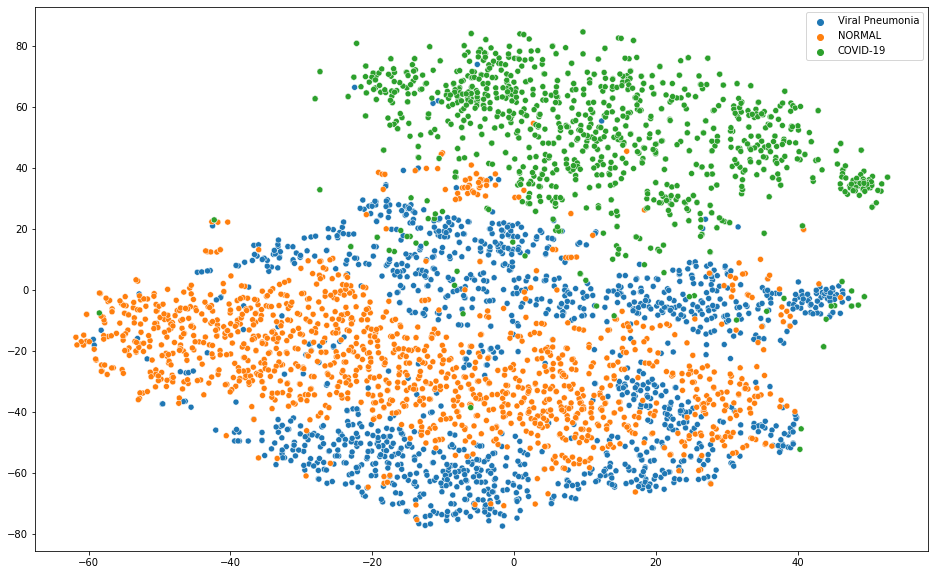

In [29]:
plt.figure(figsize=(16,10))
plt.title("Figure 8 : réduction de dimension avec TSNE ")
sns.scatterplot(
    x=X_embedded[:, 0],  y=X_embedded[:, 1] ,
    hue=Vtypes,
    data=X_embedded,
    legend="full",
    cmap='viridis_r'
)

## Interprétation de la figure 8

Ce modèle permet une meilleure distinction des trois classes. De nouveau, la classe COVID-19 est clairement identifiable.

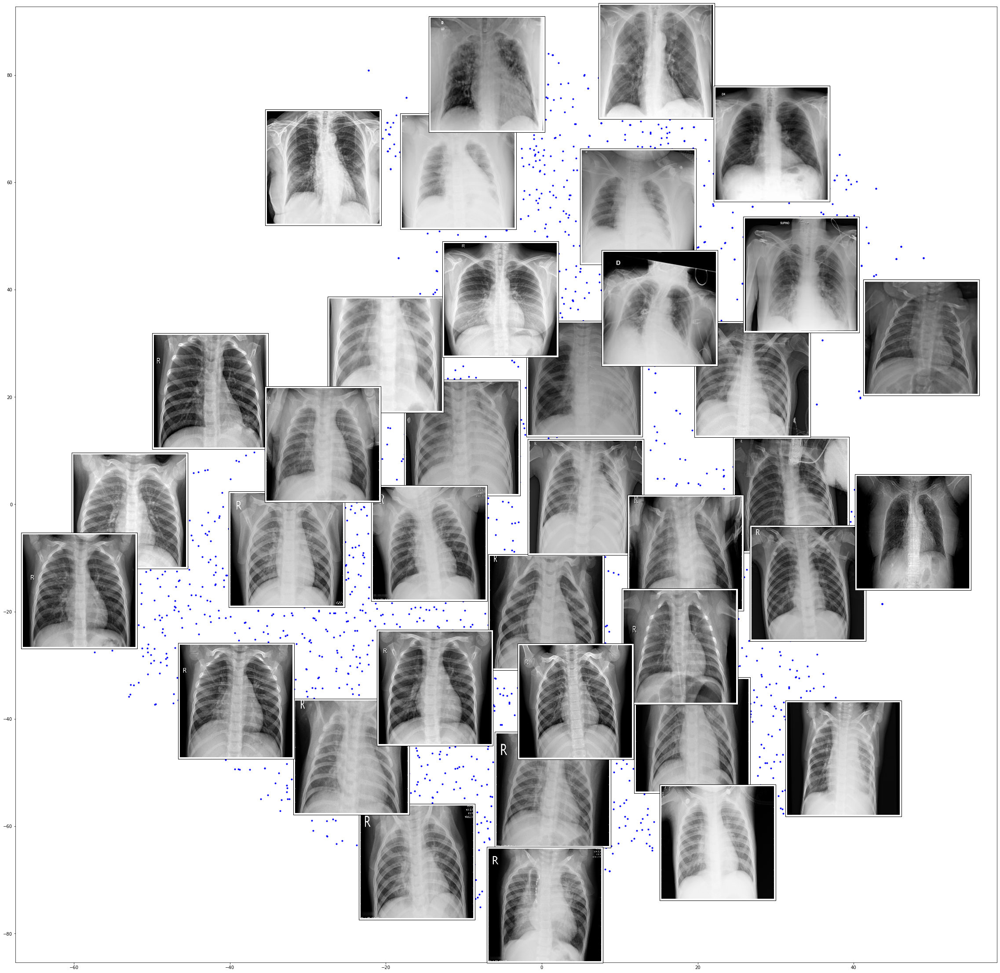

In [156]:
fig, ax = plt.subplots(figsize=(40, 40))
fig.suptitle("Figure 9 : identification des facteurs de variance dans les radiographies")
plot_components(X_embedded,
                model=model_iso,
               images=Vim.reshape((-1, 256, 256)),
               cmap = 'gray',
               thumb_frac = .1, prefit = True)

# Interprétation de la figure 9
Ce graphe confirme les observations faites sur le graphe Isomap.

# 7) Application d'un modèle TSNE 3D


In [146]:
from sklearn.manifold import TSNE
X_embedded_3D = TSNE(n_components=3).fit_transform(df)
X_embedded_3D.shape

(3829, 3)

L'execution de la cellule suivante permet d'afficher une fenêtre qui contient un graphe 3D manipulable.

In [234]:
from mpl_toolkits.mplot3d import Axes3D
%matplotlib
target = pd.Series(Vtypes).replace({'Viral Pneumonia': 0, 'NORMAL': 1, 'COVID-19': 2})
plt.title("Figure 10 : réduction de dimension avec TSNE 3D ")
fig = plt.figure(figsize = (10, 10))
ax = Axes3D(fig)
x = X_embedded_3D[:, 0]
y = X_embedded_3D[:, 1]
z = X_embedded_3D[:, 2]

ax.set_xlabel("TNSE 1")
ax.set_ylabel("TNSE 2")
ax.set_zlabel("TNSE 3")

sc = ax.scatter(x, 
           y, 
           z,
           c=target,
          )



plt.legend(*sc.legend_elements())
#plt.legend([sc], ('Viral Pneumonia', 'NORMAL', 'COVID-19'))
#plt.legend([sc], ('Viral Pneumonia', 'NORMAL', 'COVID-19'))


plt.show()

Using matplotlib backend: Qt5Agg


# Interprétation de la figure 10

Le réduction de dimension 3D apporte de la valeur ajoutée légère par rapport à la réduction en 2D.  

En modulant l'angle de vue, on observe toujours une distinction de la classe Covid-19 mais surtout, une meilleure séparation des deux autres classes (pneumo et normal).  


# Conclusion 

La visualisation des données, nous a permis de constater que les images de type COVID-19 diffèrent des autres images.
Elles sont caractérisées par une absence de bords noirs verticaux, résultant probablement d'un zoom effectué par les émetteurs de ces images.  
Cette carctéristique risque d'induire en erreur un modèle prédictif, qui se baserait sur une reconnaissance liée à celle-ci.

Il est possible de corriger ces différences en effectuant des opérations d'augmentation d'image, pour éliminer les bords noirs verticaux sur toutes les radiographies. Ainsi, le modèle se concentrera uniquement sur les différences de caractériqtiques aux niveaux des poumons. 